# MTMW14 Project 2: A simplified model of ocean gyres and the Gulf Stream

### Student No. 30825208

#### Github repository to find all code for this project: https://github.com/ao825208/MTMW14-Project-2.git

### Introduction:

The simplest dynamical model that represents a wind driven circulation in a closed rectangular ocean basin, including a western boundary current, was developed by Stommel (1948). Stommel found that streamlines would tend and crowd towards the western side of ocean basins, also known as western intensification. This model describes the horizontal flow of an incompressible fluid with a free surface and a solid lower boundary. The shallow water equations $(1)$ and $(2)$ describe the model, where it is assumed that the vertical pressure gradient is in hydrostatic balance and the equations are linearised about a resting state.

$$ \frac{d\eta}{dt} + H\nabla\cdot\boldsymbol{V} = 0 ~~~~~~~~~~~~~~(1)$$
$$ \frac{d\boldsymbol{V}}{dt} + (f_0 + \beta y)k \times\boldsymbol{V} = -g\nabla\eta - \gamma\boldsymbol{V} + \frac{\tau}{\rho H} ~~~~~~~~~~~~~(2) $$

The prognostic variables are defined as the surface elevation $\eta(\boldsymbol{x}, t)$, and the depth-averaged horizontal velocity $\boldsymbol{V} (\boldsymbol{x},t)$. Table 1 below defines the various parameters seen in the shallow water equations. 

| Parameters | Description | Value (units) |
| --- | --- | --- |
| $\boldsymbol{x} = (x, y)$  | 2D spatial coordinate | $[0, L]$ $\times$ $[0, L]$ $m$ |
| $H$  | Resting depth of fluid (assumed constant) | $1000$ $m$ |
| $f_0 + \beta y$  | Beta approximation of the coriolis parameter | $f_0 = 10^{-4}$ $s^{-1}$, $\beta = 10^{-11}$ $m^{-1}s^{-1}$ |
| $g$  | Gravitational acceleration | $10$ $m$$s^{-2}$ |
| $\gamma$  | Linear drag coefficient | $10^{-6}$$s^{-1}$ |
| $\rho$  | Uniform density | $1000$ $kg$ $m^{-3}$ |
| $\tau_0$  | Wind stress component acting on fluid in both x and y axis | $0.2Nm^{-2}$ |

##### Table 1: Parameters and variables used for the analytical and numerical solution of the ocean gyre model from Stommel (1948)

The wind stress vector is defined in equation $(3)$ and $(4)$ (for x and y directions respectively):

$$\tau_x = -\tau_0\cos \biggl(\frac{\pi y}{L}\biggr) ~~~~~~~~~~~~~~~~(3) $$

$$\tau_y = 0 ~~~~~~~~~~~~~~~(4) $$

This project will focus on the implementation of these equations into a numerical model using a forward-backward time scheme and the parameters defined in Table 1. The aim is to learn how fluid motion responds to external forcings in two-dimensions and how to develop logical thinking for improving model infrastructure.

### Defining parameters and functions:

In [1]:
# Importing packages required for project
from numpy import pi, sin, cos, exp, linspace, meshgrid, sqrt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from numba import jit
import numpy as np
import matplotlib.pyplot as plt
import time

#### Importing parameters from Table 1:

In [2]:
# Parameters
L = 1e6                 # Computational domain of grid
f_0 = 1e-4              # Initial coriolis parameter coefficient
B = 1e-11               # Beta-plane coriolis parameter coefficient
g = 10                  # Gravitation acceleration
gamma = 1e-6            # Linear drag coefficient
rho = 1e3               # Uniform density
H = 1e3                 # Resting depth of fluid (assumed constant)
tau_0 = 0.2             # Wind stress acting on fluid surface

# Dimensions
d = 5e4                 # Grid spacing ( direction)
dt = 175                # Timestep
nd = int(L/d)           # Grid size (No. of grid-points in x, y)
t = 60*60*24            # Time (1 day)
nt = int(t/dt)          # Number of time steps

#### Total energy function (required for Tasks D-G):

In [3]:
def total_energy(u, v, eta):
    """Function that numerically calculates the total energy of the
    perturbation from the resting ocean."""
    
    # Integration arrays
    x = np.linspace(0, L, len(u[1]))
    y = np.linspace(0, L, len(u[0]))
    
    # Energy method equation
    def E(u, v, eta):
        return 0.5*rho*(H*(u**2 + v**2) + g*eta**2)
    
    E = E(u, v, eta)
    
    # Integrating energy equation in both x and y arrays
    total_energy = np.sum(E)*d*d
    
    return total_energy

### Task A: Determining model parameters using the 2D CFL criterion

The ocean gyre model can support both Rossby and Gravity Inertia (GI) waves, however the propagation of GI waves are more relevant to the calculations of the 2D CFL criterion as they are faster and more likely to cause instability for the outputs of the model. It is unlikely for gravity waves to develop from the initial conditions (where the prognostic variables are at rest), however careful consideration of an appropriate timestep is vital to prevent a sudden generation of GI waves.

The Rossby radius of deformation $R_D$ can be defined:

$$R_D = \frac{\sqrt{gH}}{f_0}~~~~~~~~~~~(5) $$

With the parameters previously referred to in Table 1, $R_D = 1000km$. Using this value, a grid spacing of $d = 5\times10^{4}$ has been decided, as strong northward currents located at the western border are typically $>100km$. These values give the ratio $(6)$:

$$ \frac{R_D}{d} = \frac{10^6}{5\times10^{4}} = 20 ~~~~~~~~~~~~~(6)$$

To ensure a fine grid setup best represented on an Arakawa C-grid, the grid spacing has been defined as $nd = 20$ which should stagger the prognostic variables without producing an unstable solution.

The 2D CFL criterion can be defined:

$$ \frac{V_s\Delta t\sqrt{2}}{d} \le 1 ~~~~~~~~~~~~~~~~(7)$$

Where $V_s$ represents gravity wave speed ($100ms^{-1}$), $\Delta t$ is the time step, $d$ is the grid spacing. As discussed, it is crucial this criterion is respected or we risk the instability of the model and the introduction of GI waves. Rearranging, we obtain a time step $\Delta t \le 353.55$, where the timestep was chosen to be $t = 175$ to allow for a stable solution.

In Figure 1, a diagram of the Arakawa C-grid is provided, and a brief flowchart of the plan for the structure of the numerical code.

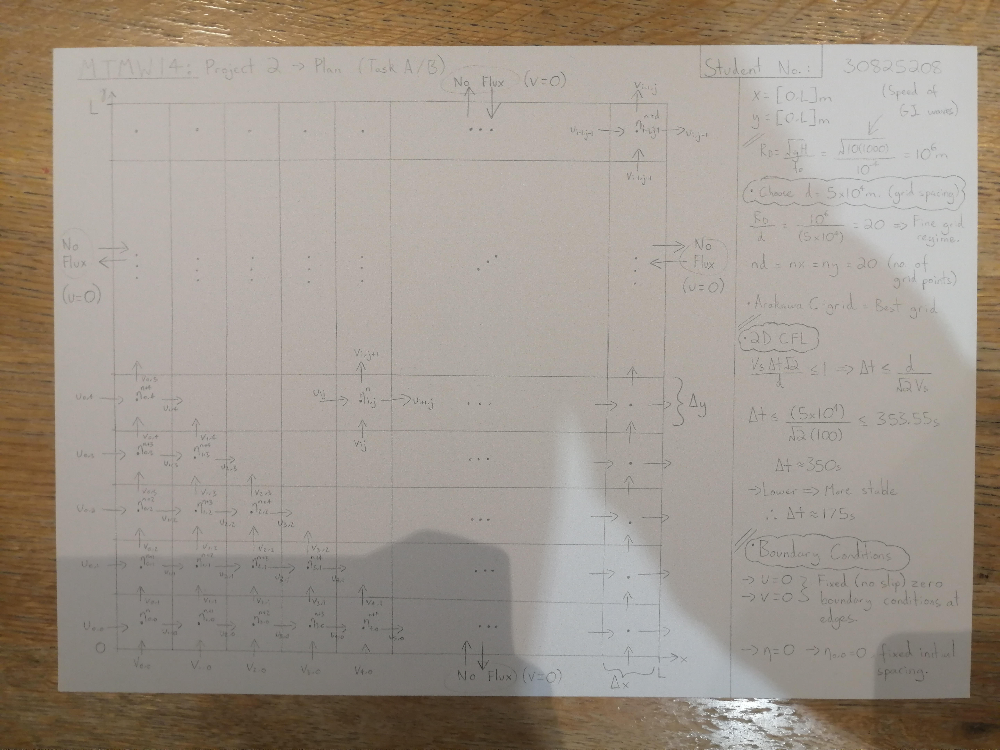

##### Figure 1: Diagram of the Arakawa C-grid to be introduced for Tasks C-G.

### Task B: Determining the boundary conditions and a plan for implementation

At the zonal and meridional boundaries, fixed zero (no-slip) boundary conditions have been considered for the zonal and meridional velocities (e.g. $u_{0,0} = 0$, $v_{0,0} = 0$) as to ensure no flow passes through. The boundary conditions of $\eta$ are considered to also be fixed to zero at its initial resting point $\eta_{0,0}$.

Figure 2 consists of a flow chart indicating the steps being taken to carry out this project.

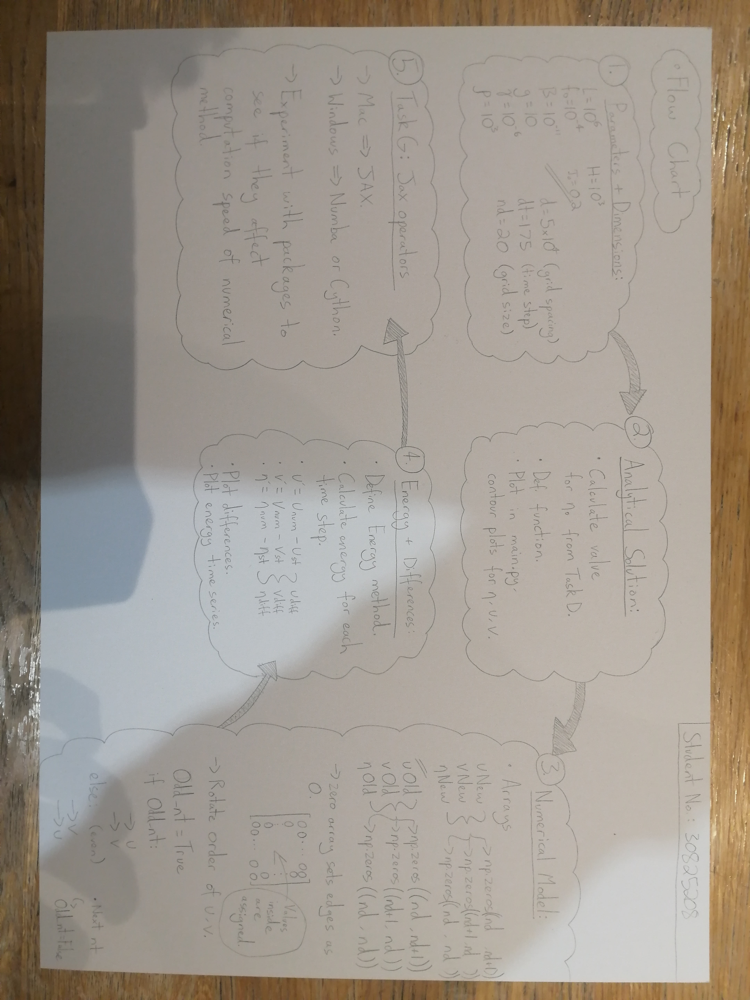

##### Figure 2: Flow chart of steps to undertake in Project 2

### Task C: Reproducing the steady state analytical solutions for the shallow water equations

The shallow water equations were derived by Mushgrave (1985) to find analytical solutions for the steady state. These solutions can be plotted on a contour plot to find an approximate solution to the steady state solution, which can be compared to the numerical model derived in Task D. The value of $\eta(0, L/2) = \eta_0$ can be calculated by observing the steady state solution in Task D, where $\eta_0 = 0.07583681292138715$ (see Task D).

In [4]:
def analytic_soln(x, y):
    """Function that determines the analytical solution for the shallow water
    equations derived by Mushgrave (1985)."""
    
    # Constant of integration determined from Task D
    eta_0 = 0.07583681292138715
    
    # Constants required to detemine solutions
    epsilon = gamma/(L*B)
    a = (-1 - (sqrt(1 + (2*pi*epsilon)**2)))/(2*epsilon)
    b = (-1 + (sqrt(1 + (2*pi*epsilon)**2)))/(2*epsilon)
    
    # Functions required to determine solutions
    def f1(x):
        return pi*(1 + ((exp(a) - 1)*(exp(b*x))\
                       + (1 - exp(b))*exp(a*x))/(exp(b) - exp(a)))
            
    def f2(x):
        return ((exp(a) - 1)*b*(exp(b*x)) +\
                (1 - exp(b))*a*exp(a*x))/(exp(b) - exp(a))
            
    # Determining values for the steady state solutions of each parameter along
    # the x and y axis
    u_st = (-tau_0/(pi*gamma*rho*H))*(f1(x/L))*cos(pi*y/L)
    v_st = (tau_0/(pi*gamma*rho*H))*(f2(x/L))*sin(pi*y/L)
    eta_st = eta_0 + (tau_0/(pi*gamma*rho*H))*((f_0*L)/g)*\
        ((gamma/(f_0*pi))*(f2(x/L))*cos(pi*y/L) +\
         (1/pi)*(f1(x/L))*sin(pi*y/L)*(1 + (B*y/f_0)\
                           + (B*L/(f_0*pi))*cos(pi*y/L)))
            
    return u_st, v_st, eta_st

In [5]:
def analytic():
    """Function that plots the analytic solution derived by Mushgrave (1985)
    onto individual contour plots for each steady state variable."""

    # Grid set-up in both dimensions
    x = linspace(0, L, int(nd))
    y = linspace(0, L, int(nd))
    
    # Defining the solution
    X, Y = meshgrid(x, y)
    u_st, v_st, eta_st = analytic_soln(X, Y)

    # Building a figure
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 4))
    fig.suptitle("Task C: Analytical solution", fontsize = 25)

    # Plotting a contour graph for n_st 
    cp1 = ax1.contourf(X, Y, eta_st)
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('right', size = '5%', pad = 0.15)
    ax1.set_title('$\eta$', fontsize = 20)
    ax1.set_xlabel('$x$ [0, L] ($m$)', fontsize = 10)
    ax1.set_ylabel('$y$ [0, L] ($m$)', fontsize = 10)
    fig.colorbar(cp1, cax = cax, orientation = 'vertical',\
                 label = 'Surface elevation ($m$)')

    # Plotting a contour graph for u_st 
    cp2 = ax2.contourf(X, Y, u_st)
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes('right', size = '5%', pad = 0.15)
    ax2.set_title('$u$', fontsize = 20)
    ax2.set_xlabel('$x$ [0, L] ($m$)', fontsize = 10)
    ax2.set_ylabel('$y$ [0, L] ($m$)', fontsize = 10)
    fig.colorbar(cp2, cax = cax, orientation = 'vertical', \
                 label = 'Horizontal velocity ($ms^{-1}$)')

    # Plotting a contour graph for v_st 
    cp3 = ax3.contourf(X, Y, v_st)
    divider = make_axes_locatable(ax3)
    cax = divider.append_axes('right', size = '5%', pad = 0.15)
    ax3.set_title('$v$', fontsize = 20)
    ax3.set_xlabel('$x$ [0, L] ($m$)', fontsize = 10)
    ax3.set_ylabel('$y$ [0, L] ($m$)', fontsize = 10)
    fig.colorbar(cp3, cax = cax, orientation = 'vertical', \
                 label = 'Vertical velocity ($ms^{-1}$)')

    fig.tight_layout()

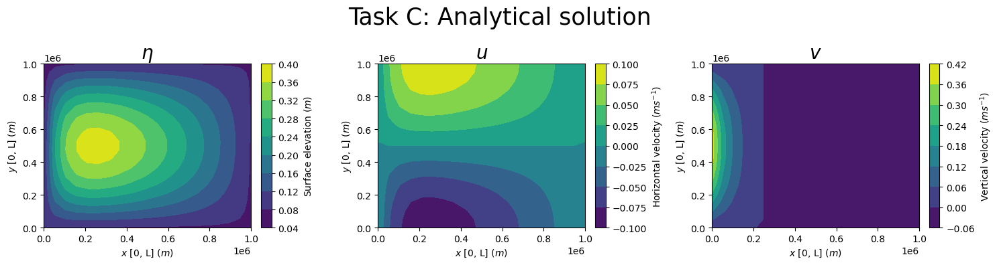

In [6]:
analytic()

##### Figure 3: Plots of the steady state analytical solution derived by Mushgrave (1985), (i) $\eta$ contour plot (left), (ii) $u$ contour plot (middle) and (iii) $v$ contour plot (right).

This solution will be used as a benchmark test to compare to the numerical model.

### Task D: Development of a forward-backward time scheme model for the shallow water equations

Matsuno (1966), Beckers and Deleersnijder (1993) built an implicit forward-backward time scheme method which utilised the following equations:

$$\eta^{n+1} = \eta^{n} - H\Delta t \biggl(\frac{\partial u^{n}}{\partial x} + \frac{\partial v^{n}}{\partial y} \biggr) ~~~~~~~~~~~~~~(8)$$
$$u^{n+1} = u^{n} + (f_0 + \beta y)\Delta t v^{n} - g\Delta t \frac{\partial\eta^{n+1}}{\partial x} - \gamma\Delta t u^{n} + \frac{\tau_x}{\rho H}\Delta t ~~~~~~~~~~~~~~(9)$$
$$v^{n+1} = v^{n} - (f_0 + \beta y)\Delta t u^{n+1} - g\Delta t \frac{\partial\eta^{n+1}}{\partial y} - \gamma\Delta t v^{n} + \frac{\tau_y}{\rho H}\Delta t ~~~~~~~~~~~~~~~(10)$$

Where equations (9) and (10) alternate in order for every other time step (code sets odd number time steps to go in order $(9)$, $(10)$ and even time steps in order $(10)$, $(9)$.

To ensure $u$ and $v$ remain at $0$ at the zonal and meridional boundaries, the code sets up an array of 0 values, where the loops identify new values from after the initial conditions.

In [7]:
def FBT_scheme(d, t, dt):
    """Forward-backward time scheme that solves for new values of eta, u, v the 
    shallow water equations, also using the Arakawa C grid to define the
    derivatives dudx, dvdy and detady."""
    
    # Number of time steps
    nt = int(t/dt)          

    # Creating arrays for new values of u, v and eta
    uNew = np.zeros((nd + 2, nd + 2))
    vNew = np.zeros((nd + 2, nd + 2))
    etaNew = np.zeros((nd + 2, nd + 2))
    
    # Creating arrays for old values of u, v and eta
    uOld = np.zeros((nd + 2, nd + 2))
    vOld = np.zeros((nd + 2, nd + 2))
    etaOld = np.zeros((nd + 2, nd + 2))
    
    total_energy_time = np.zeros([nt])
    
    # For each odd time step, u is calculated before v
    Odd_nt = True
    
    # Stepping through time
    for n in range(nt): 
        # Stepping through y direction
        for j in range(1, nd + 1): 
            # Stepping through x direction
            for i in range(1, nd + 1):
                # Arakawa C-grid implementation
                dudx = (uOld[j, i + 1] - uOld[j, i])/d
                dvdy = (vOld[j + 1, i] - vOld[j, i])/d 
                etaNew[j, i] = etaOld[j, i] - (H*dt)*(dudx + dvdy) 
        # Odd timestep
        if Odd_nt:  
            # Calculating new u
            # Stepping through y direction
            for j in range(1, nd + 1): 
                # Wind stress calculated at each j step
                tau = [-np.cos(np.pi*j*d/L)*tau_0, 0] 
                # Stepping through x direction
                for i in range(1, nd + 1):              
                    detadx = (etaNew[j, i] - etaNew[j, i - 1])/d
                    fv = (f_0 + B*j*d)*(vOld[j, i] + vOld[j + 1, i] +\
                                          vOld[j, i - 1] +\
                                              vOld[j + 1, i - 1])/4
                    uNew[j, i] = uOld[j, i] +  dt*fv  - g*dt*detadx -\
                        gamma*dt*uOld[j, i] + tau[0]*dt/(rho*H)
            # Calculating new v
            # Stepping through y direction
            for j in range(1, nd + 1): 
                # Wind stress calculated at each j step
                tau = [-np.cos(np.pi*j*d/L)*tau_0 , 0] 
                # Stepping through x direction
                for i in range(1, nd + 1): 
                    detady = (etaNew[j, i] - etaNew[j - 1, i])/d
                    fu = (f_0 + B*j*d)*(uNew[j, i] + uNew[j, i + 1] +\
                                          uNew[j - 1, i] +\
                                              uNew[j - 1, i + 1])/4
                    vNew[j, i] = vOld[j, i] - dt*fu  - g*dt*detady -\
                        gamma*dt*vOld[j, i] + tau[1]*dt/(rho*H)
                        
        # For each even time step, v is calculated before u
        else: 
            # Calculating new v
            # Stepping through y direction
            for j in range(1, nd + 1):
                # Wind stress calculated at each j step
                tau = [-np.cos(np.pi*j*d/L)*tau_0, 0] 
                # Stepping through x direction  
                for i in range(1, nd + 1):              
                    detady = (etaNew[j, i] - etaNew[j - 1, i])/d
                    fu = (f_0 + B*j*d)*(uOld[j, i] + uOld[j, i + 1] +\
                                          uOld[j - 1, i] +\
                                              uOld[j - 1, i + 1])/4
                    vNew[j, i] = vOld[j, i] - dt*fu  - g*dt*detady -\
                        gamma*dt*vOld[j, i] + tau[1]*dt/(rho*H)
            # Calculating new u
            # Stepping through y direction
            for j in range(1, nd + 1):
                # Wind stress calculated at each j step
                tau = [-np.cos(np.pi*j*d/L)*tau_0, 0] 
                # Stepping through x direction 
                for i in range(1, nd + 1):              
                    detadx = (etaNew[j, i] - etaNew[j, i - 1])/d
                    fv = (f_0 + B*j*d)*(vNew[j, i] + vNew[j + 1, i] +\
                                          vNew[j, i - 1] +\
                                              vNew[j + 1, i - 1])/4
                    uNew[j, i] = uOld[j, i] +  dt*fv  - g*dt*detadx -\
                        gamma*dt*uOld[j, i] + tau[0]*dt/(rho*H)
        
        # Calculate energy integral
        total_energy_time[n] = total_energy(uNew, vNew, etaNew)
        
        # Toggling between odd/even
        Odd_nt = not Odd_nt 
        
        # Resetting variables
        uOld = uNew
        vOld = vNew
        etaOld = etaNew
    
    return uNew, vNew, etaNew, total_energy_time

In [8]:
def numerical(t):
    """Function that defines the plots for the forward-backward time scheme to
    solve the shallow water momentum equations derived by Matsuno (1966)."""
    
    # Values of u, v, eta
    uNew, vNew, etaNew, total_energy_time = FBT_scheme(d, t, dt)
    
    # Building a figure
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (25, 20))
    fig.suptitle("Task D: Forward-backward time scheme model", fontsize = 35)
    
    # Plotting 1D arrays for the x and y axis
    x = np.linspace(0, L, int(nd + 2))
    y = np.linspace(0, L, int(nd + 2))
    
    # Plot 1: u vs. x
    ax1.plot(x, uNew[3, :])
    ax1.set_xlabel('$x$ [0, L] ($m$)', fontsize = 20)
    ax1.set_ylabel('$u$ ($ms^{-1}$)', fontsize = 20)
    ax1.tick_params(axis = 'both', which = 'major', labelsize = 20)
    ax1.tick_params(axis = 'both', which = 'minor', labelsize = 20)
    ax1.set_title('$u$ vs $x$', fontsize = 30)
    
    # Plot 2: v vs. y
    ax2.plot(y, vNew[:, 4])
    ax2.set_xlabel('$y$ [0, L] ($m$)', fontsize = 20)
    ax2.set_ylabel('$v$ ($ms^{-1}$)', fontsize = 20)
    ax2.tick_params(axis = 'both', which = 'major', labelsize = 20)
    ax2.tick_params(axis = 'both', which = 'minor', labelsize = 20)
    ax2.set_title('$v$ vs $y$', fontsize = 30)
    
    # Plot 3: eta vs. x
    gyre_mid = int((nd + 2)/2)
    ax3.plot(x, etaNew[gyre_mid, :])
    ax3.set_xlabel('$\eta$ ($m$)', fontsize = 20)
    ax3.set_ylabel('$y$ [0, L] ($m$)', fontsize = 20)
    ax3.tick_params(axis = 'both', which = 'major', labelsize = 20)
    ax3.tick_params(axis = 'both', which = 'minor', labelsize = 20)
    ax3.set_title('$\eta$ vs $x$', fontsize = 30)
    
    # Plot 4: 2D Contour plot of eta
    cp = ax4.contourf(x, y, etaNew[:, :])
    divider = make_axes_locatable(ax4)
    cax = divider.append_axes('right', size = '5%', pad = 0.15)
    ax4.set_title('$\eta$', fontsize = 30)
    ax4.set_xlabel('$x$ [0, L] ($m$)', fontsize = 20)
    ax4.set_ylabel('$y$ [0, L] ($m$)', fontsize = 20)
    ax4.tick_params(axis = 'both', which = 'major', labelsize = 20)
    ax4.tick_params(axis = 'both', which = 'minor', labelsize = 20)
    cbar = fig.colorbar(cp, cax = cax, orientation = 'vertical')
    cbar.ax.tick_params(labelsize = 15)
    cbar.set_label('Elevation ($m$)', fontsize = 20)
    
    fig.tight_layout()
    
    # Prints the value required for eta_0 in the analytical condition
    print("eta_0 is: ", etaNew[int((nd+2)/2), 1], "m")

#### D.1 (Sanity check):

eta_0 is:  0.004185698806367926 m


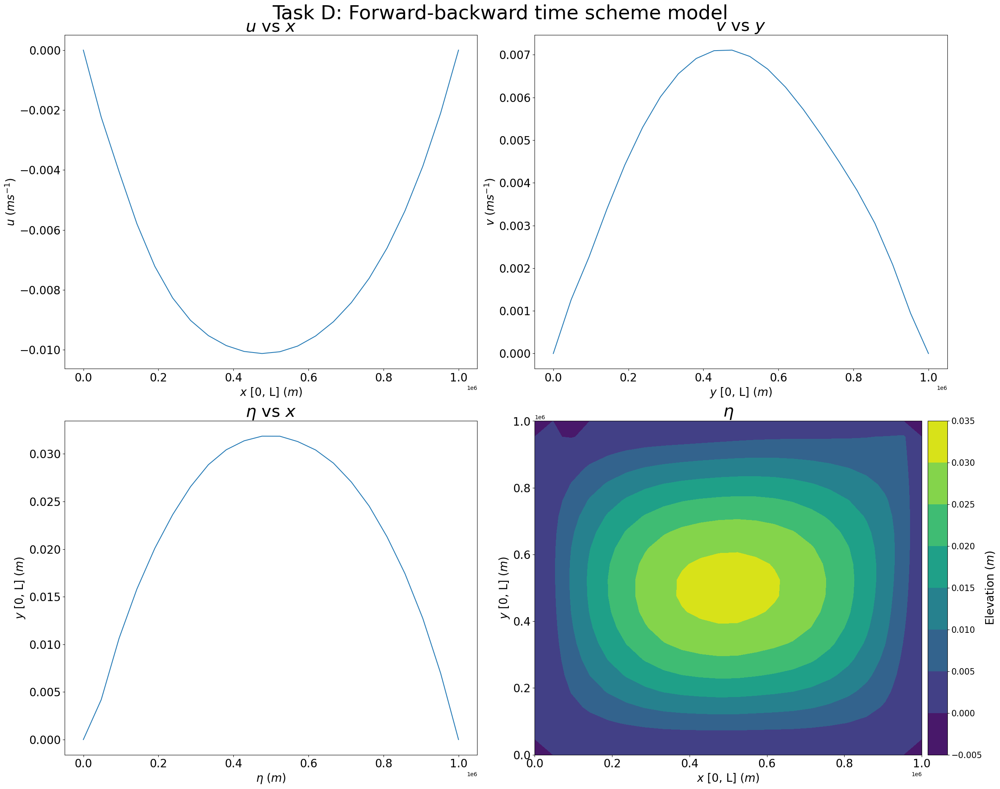

In [9]:
numerical(t)       

##### Figure 4: Forward-backward time scheme numerical model for the shallow water equations derived by Matsuno (1966) and Beckers and Deleersnijder (1993), (i) $u$ vs. $x$ at the southern edge of the basin (top left), (ii) $v$ vs. $y$ at the western edge of the basin (top right), (iii) $\eta$ vs. $x$ at the middle of the gyre, (iv) $\eta$ 2D contour plot, all estimated for the time duration of 1 day ($t = 86400$).

In Figure 4, the model ran at one day produces a stable clockwise gyre within the ocean basin. The southern edge of the basin in __4(i)__ demonstrates a decline in zonal velocity away from the East/West boundaries and then an increase as a fluid parcel travels closer to the boundaries as it propagates in an westward direction. However, in the meridional direction at the western edge of the basin __4(ii)__, the meridional velocity appears to increase away from the North/South boundaries, and decreases as a fluid parcel returns to the boundaries. Similarly, the magnitude of $\eta$, the elevation of the basin, appears to increase away from the boundaries through the middle of the gyre, and decrease as it approaches the edges as seen in __4(iii)__. This can further be observed in the 2D contour plot in __4(iv)__ when considering the middle of the gyre.

#### D.2 (Steady state)

eta_0 is:  0.07583681292138715 m
Elapsed time for Task D computation = 52.65658235549927 s


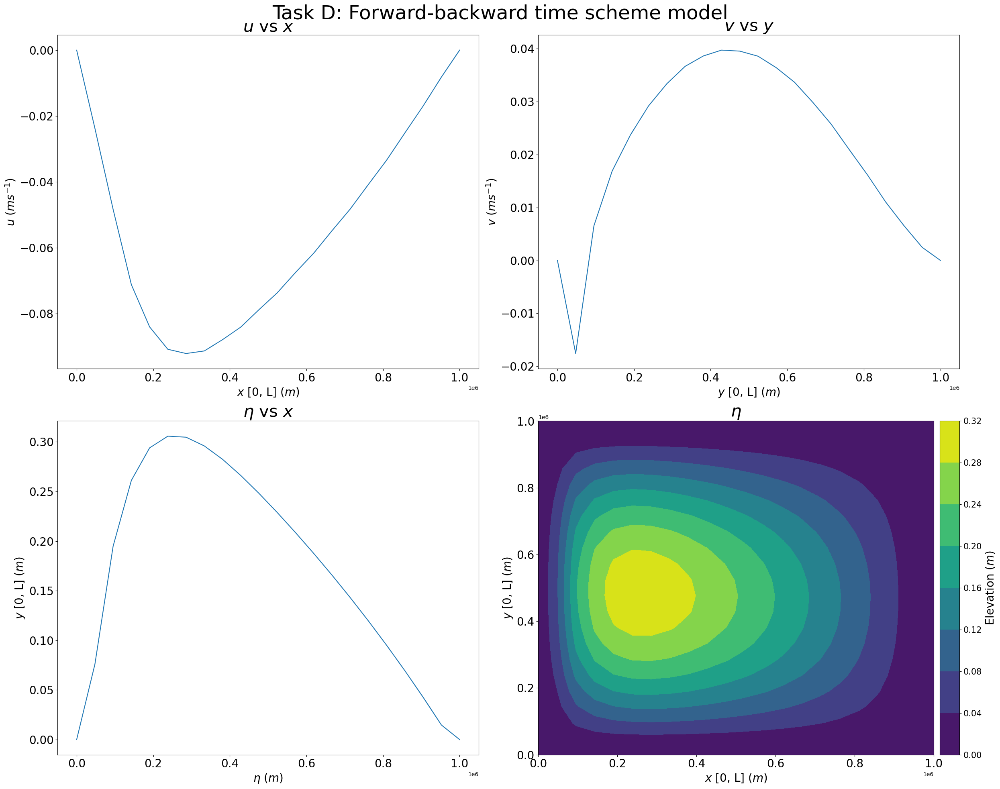

In [10]:
# Calculating processing time for numerical scheme (required for task G)
start1 = time.time()
numerical(t*40)
end1 = time.time()
print("Elapsed time for Task D computation = %s" % (end1 - start1), "s")

##### Figure 5: Forward-backward time scheme numerical model for the shallow water equations derived by Matsuno (1966) and Beckers and Deleersnijder (1993), (i) $u$ vs. $x$ at the southern edge of the basin (top left), (ii) $v$ vs. $y$ at the western edge of the basin (top right), (iii) $\eta$ vs. $x$ at the middle of the gyre, $\eta$ 2D contour plot, all estimated for the time duration of 40 days ($t = 40\times86400s$).

The $\eta_0$ found through the steady state solution of this model evaluates what value has been used for $\eta_0$ in Task C.

By running the numerical model for a longer period of time (40 days), eventually the ocean gyre should converge to a steady state similar to the analytical solution defined in Task C. The steady state appears to have been reached within roughly 40 days, as demonstrated in Figure 5, where the gyre has undergone westward intensification. Similar to Figure 4, figures __(i)__, __(ii)__, __(iii)__ and __(iv)__ show clear demonstrations of the maximum values, for $u$, $v$, $\eta$ respecitively, skewed to the western boundary of the basin. The maximum value of $\eta$ reaches a value roughly around $0.32m$, similar to the steady state maximum.

#### D.3 (Differences between the analytical and numerical)

In [11]:
def diff_plots():
    """Function that plots the differences between the numerical and
    the steady state analytical solutions."""
    
    # Defining x and y spaces
    x1 = linspace(0, L, int(nd + 2))
    y1 = linspace(0, L, int(nd + 2))
    
    X1, Y1 = meshgrid(x1, y1)
    
    # Defining solutions from the steady state and numerical models
    u_st, v_st, eta_st = analytic_soln(X1, Y1)
    uNew, vNew, etaNew, total_energy_time = FBT_scheme(d, t*40, dt)
    
    # Difference between the numerical and analytic solutions
    u_diff = uNew - u_st
    v_diff = vNew - v_st
    eta_diff = etaNew - eta_st
    
    # Defining the different energy differences
    energy_diff = total_energy(u_diff, v_diff, eta_diff)
    energy_st = total_energy(u_st, v_st, eta_st)
    energy_num = total_energy(uNew, vNew, etaNew)
    
    # Building a figure
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 4))
    fig.suptitle("Task D.3: Energy differences", fontsize = 25)

    # Plotting a contour graph for n_st 
    cp1 = ax1.contourf(x1, y1, eta_diff)
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('right', size = '5%', pad = 0.15)
    ax1.set_title('$\eta$', fontsize = 20)
    ax1.set_xlabel('$x$ [0, L] ($m$)', fontsize = 10)
    ax1.set_ylabel('$y$ [0, L] ($m$)', fontsize = 10)
    fig.colorbar(cp1, cax = cax, orientation = 'vertical',\
                 label = 'Surface elevation ($m$)')

    # Plotting a contour graph for u_st 
    cp2 = ax2.contourf(x1, y1, u_diff)
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes('right', size = '5%', pad = 0.15)
    ax2.set_title('$u$', fontsize = 20)
    ax2.set_xlabel('$x$ [0, L] ($m$)', fontsize = 10)
    ax2.set_ylabel('$y$ [0, L] ($m$)', fontsize = 10)
    fig.colorbar(cp2, cax = cax, orientation = 'vertical', \
                 label = 'Horizontal velocity ($ms^{-1}$)')

    # Plotting a contour graph for v_st 
    cp3 = ax3.contourf(x1, y1, v_diff)
    divider = make_axes_locatable(ax3)
    cax = divider.append_axes('right', size = '5%', pad = 0.15)
    ax3.set_title('$v$', fontsize = 20)
    ax3.set_xlabel('$x$ [0, L] ($m$)', fontsize = 10)
    ax3.set_ylabel('$y$ [0, L] ($m$)', fontsize = 10)
    fig.colorbar(cp3, cax = cax, orientation = 'vertical', \
                 label = 'Vertical velocity ($ms^{-1}$)')
    
    fig.tight_layout()

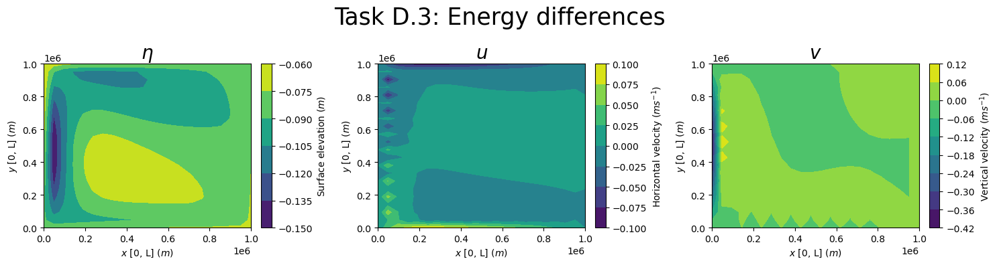

In [12]:
diff_plots()

##### Figure 6: Plots of the differences between the numerical model and the steady state analytical solutions, (i) $\eta$ contour plot (left), (ii) $u$ contour plot (middle) and (iii) $v$ contour plot (right).

Figure 6 illustrates the differences between the numerical and steady state solutions for $\eta$, $u$ and $v$ respectively. The values appear to be larger in the analytical solution for $\eta$ as the values have all become negative in __6(i)__. This is the case for $u$ and $v$ graphs also, which implies that the numerical model is slightly off in computing the associated values for the analytical solution. The triangular shape that appears in Figures __6(ii)__ and __6(iii)__ might be a sign of instability in the model or the array values being interpreted incorrectly.

### Task E: The energy method

The total energy of the perturbation from the resting ocean can be computed using the following formula:

$$ E(u, v, \eta) = \int_{0}^{L}\int_{0}^{L} \frac{1}{2}\rho(H(u^{2} + v^{2}) + g\eta^{2})dx dy ~~~~~~~~~~~~(11)$$

For this task, the total energy will plotted in a time series until the numerical model reaches the steady state.

In [13]:
def energy_method(d, dt):
    """Function that plots a time series graph of the evolution of energy from
    the numerical model."""
    
    # Defining x and y spaces
    x1 = linspace(0, L, int(nd + 2))
    y1 = linspace(0, L, int(nd + 2))
    
    X1, Y1 = meshgrid(x1, y1)
    
    # Defining solutions from the steady state and numerical models
    u_st, v_st, eta_st = analytic_soln(X1, Y1)
    uNew, vNew, etaNew, total_energy_time = FBT_scheme(d, t*40, dt)
    
    # Difference between the numerical and analytic solutions
    u_diff = uNew - u_st
    v_diff = vNew - v_st
    eta_diff = etaNew - eta_st
    
    # Defining the different energy differences
    energy_diff = total_energy(u_diff, v_diff, eta_diff)
    energy_st = total_energy(u_st, v_st, eta_st)
    energy_num = total_energy(uNew, vNew, etaNew)

    # Plotting the graph of total energy vs. time
    time_axis = linspace(0, t*40, int(t*40/dt))
    
    # Building a figure
    fig, ax = plt.subplots(figsize = (8, 5))
    fig.suptitle("Task E: Total Energy time series", fontsize = 25)
    
    # Plotting the solution
    ax.plot(time_axis, total_energy_time)
    ax.set_ylabel('Energy ($J$)')
    ax.set_xlabel('Time ($s$)')
    ax.set_title('Total energy vs. time')
    
    fig.tight_layout()
    
    # Determining the error measurement between the steady state and numerical
    # solutions
    print("Energy error measurement =", energy_diff, "J")
    print("Steady state total energy value = ", total_energy_time[-1], "J")

Energy error measurement = 2474327162047286.0 J
Steady state total energy value =  3050224718191578.5 J


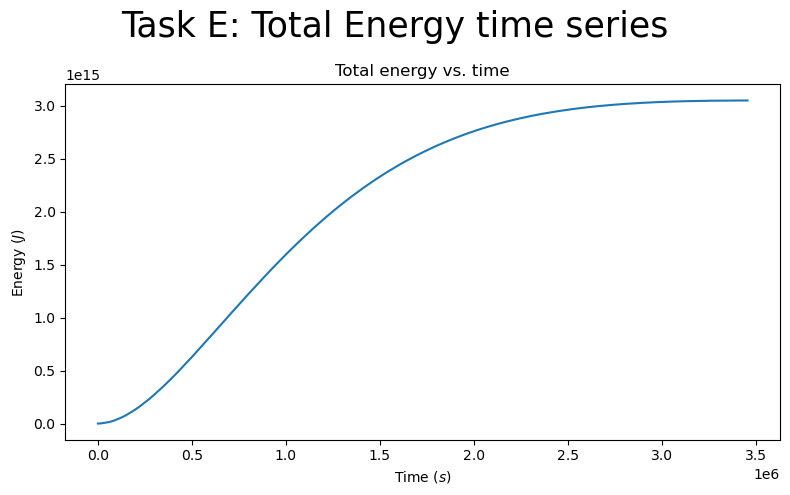

In [14]:
energy_method(d, dt)

##### Figure 7: Time series graph of total energy of the perturbation from the resting ocean, until the numerical model reaches a steady state, ran for 40 days ($t = 40\times86400s$).

The numerical model reaches its steady state at approximately $3 \times 10^{15} J$, implying this is the total amount of energy required for the steady state clockwise propagation of the ocean gyre. In Figure 7, the graph tends to this final value after roughly 30 days, reaching a stable solution, implying our choice of time step and decisions made in Tasks A and B are valid.

#### Reducing grid spacing and increasing resolution of model:

By reducing the grid spacing by a factor of $\frac{1}{2}$, the model can be shown to tend towards its exact solution as resolution increases (i.e. the energy error measurement should reduce). For this test, the 2D CFL criterion has had to be reconsidered, and a new value for the time step has been found as $dt \le 176$, where $dt = 100$ in the following figure.

Energy error measurement = 3046823973058544.0 J
Steady state total energy value =  823564442642971.1 J


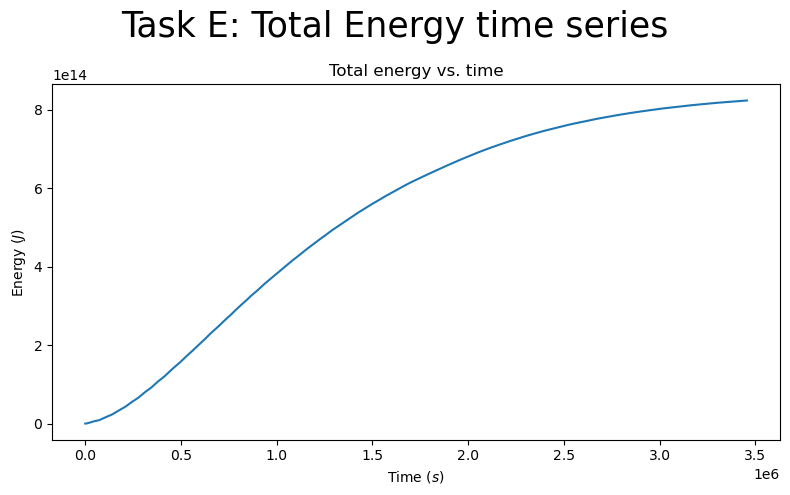

In [15]:
energy_method(d*0.5, 100)

##### Figure 8: Time series graph of total energy of the perturbation from the resting ocean, until the numerical model reaches a steady state, ran for 40 days ($t = 40\times86400s$), with half the grid spacing, $d = 0.5\times d$, and a new time step that satifies 2D CFL $dt = 100 \le 176$.

### Task G.2: Using computational optimisation aspects to reduce model computation time

Using a forward-backward time scheme method that involves lots of loops can make computation time take a lot longer than it should. To speed up the looping process, Intel-specific optimisation packages such as JAX and Numba can be introduced to reduce the time taken to carry out simple vectorisation.

If using a Mac system, this computation can be sped up using the JAX package, if using a Windows system, Numba can be introduced instead which will translate subsets and arrays in Python and convert numpy code into fast machine code. It is quite advantageous as it is easy to use and offers GPU support.

In [16]:
@jit(nopython = False)
def FBT_schemeG(d, t, dt):
    """Forward-backward time scheme that solves for new values of eta, u, v the 
    shallow water equations, also using the Arakawa C grid to define the
    derivatives dudx, dvdy and detady."""
    
    # Number of time steps
    nt = int(t/dt)          

    # Creating arrays for new values of u, v and eta
    uNew = np.zeros((nd + 2, nd + 2))
    vNew = np.zeros((nd + 2, nd + 2))
    etaNew = np.zeros((nd + 2, nd + 2))
    
    # Creating arrays for old values of u, v and eta
    uOld = np.zeros((nd + 2, nd + 2))
    vOld = np.zeros((nd + 2, nd + 2))
    etaOld = np.zeros((nd + 2, nd + 2))
    
    total_energy_time = np.zeros([nt])
    
    # For each odd time step, u is calculated before v
    Odd_nt = True
    
    # Stepping through time
    for n in range(nt): 
        # Stepping through y direction
        for j in range(1, nd + 1): 
            # Stepping through x direction
            for i in range(1, nd + 1): 
                dudx = (uOld[j, i + 1] - uOld[j, i])/d
                dvdy = (vOld[j + 1, i] - vOld[j, i])/d 
                etaNew[j, i] = etaOld[j, i] - (H*dt)*(dudx + dvdy) 
        # Odd timestep
        if Odd_nt:  
            # Calculating new u
            # Stepping through y direction
            for j in range(1, nd + 1): 
                # Wind stress calculated at each j step
                tau = [-np.cos(np.pi*j*d/L)*tau_0, 0] 
                # Stepping through x direction
                for i in range(1, nd + 1):              
                    detadx = (etaNew[j, i] - etaNew[j, i - 1])/d
                    fv = (f_0 + B*j*d)*(vOld[j, i] + vOld[j + 1, i] +\
                                          vOld[j, i - 1] +\
                                              vOld[j + 1, i - 1])/4
                    uNew[j, i] = uOld[j, i] +  dt*fv  - g*dt*detadx -\
                        gamma*dt*uOld[j, i] + tau[0]*dt/(rho*H)
            # Calculating new v
            # Stepping through y direction
            for j in range(1, nd + 1): 
                # Wind stress calculated at each j step
                tau = [-np.cos(np.pi*j*d/L)*tau_0 , 0] 
                # Stepping through x direction
                for i in range(1, nd + 1): 
                    detady = (etaNew[j, i] - etaNew[j - 1, i])/d
                    fu = (f_0 + B*j*d)*(uNew[j, i] + uNew[j, i + 1] +\
                                          uNew[j - 1, i] +\
                                              uNew[j - 1, i + 1])/4
                    vNew[j, i] = vOld[j, i] - dt*fu  - g*dt*detady -\
                        gamma*dt*vOld[j, i] + tau[1]*dt/(rho*H)
                        
        # For each even time step, v is calculated before u
        else: 
            # Calculating new v
            # Stepping through y direction
            for j in range(1, nd + 1):
                # Wind stress calculated at each j step
                tau = [-np.cos(np.pi*j*d/L)*tau_0, 0] 
                # Stepping through x direction  
                for i in range(1, nd + 1):              
                    detady = (etaNew[j, i] - etaNew[j - 1, i])/d
                    fu = (f_0 + B*j*d)*(uOld[j, i] + uOld[j, i + 1] +\
                                          uOld[j - 1, i] +\
                                              uOld[j - 1, i + 1])/4
                    vNew[j, i] = vOld[j, i] - dt*fu  - g*dt*detady -\
                        gamma*dt*vOld[j, i] + tau[1]*dt/(rho*H)
            # Calculating new u
            # Stepping through y direction
            for j in range(1, nd + 1):
                # Wind stress calculated at each j step
                tau = [-np.cos(np.pi*j*d/L)*tau_0, 0] 
                # Stepping through x direction 
                for i in range(1, nd + 1):              
                    detadx = (etaNew[j, i] - etaNew[j, i - 1])/d
                    fv = (f_0 + B*j*d)*(vNew[j, i] + vNew[j + 1, i] +\
                                          vNew[j, i - 1] +\
                                              vNew[j + 1, i - 1])/4
                    uNew[j, i] = uOld[j, i] +  dt*fv  - g*dt*detadx -\
                        gamma*dt*uOld[j, i] + tau[0]*dt/(rho*H)
        
        # Calculate energy integral
        total_energy_time[n] = total_energy(uNew, vNew, etaNew)
        
        # Toggling between odd/even
        Odd_nt = not Odd_nt 
        
        # Resetting variables
        uOld = uNew
        vOld = vNew
        etaOld = etaNew
    
    return uNew, vNew, etaNew, total_energy_time

In [17]:
# Filters numba warnings
import warnings
warnings.filterwarnings('ignore')

In [18]:
# Calculating processing time for numerical scheme with numba
start2 = time.time()
FBT_schemeG(d, t*40, dt);
end2 = time.time()
print("Elapsed time for Task G computation = %s" % (end2 - start2), "s")

Elapsed time for Task G computation = 55.63919115066528 s


In [19]:
print("Overall time difference =", (end2 - start2) - (end1 - start1), "s")

Overall time difference = 2.9826087951660156 s


Overall, Numba computes an almost 3 second difference between the original computation of the numerical model and this new one. However, multiple calculations of this result seems to show that Numba can often take 3 seconds longer to carry out the computation, this may be due to the original structure of the numerical model as it contains lots of loops. To test how Numba works with numpy arrays again in future experiments, a numerical model written without the use of loops should be developed. Or using a mac system, the JAX module may provide better results than Numba.